<center>
    
# Part 2b - Model & Last Document


# Model Using StopWords of Player's and Team's Names


# Barcelona vs Real Madrid - El Clásico de Reddit


# Christopher Williams Project 3

</center>

<a id='sm'></a>
## Summary of Models


#### Based on Comments collected from following 2 subreddits: Barca & realmadrid

- FC Barcelona and Real Madrid are futbol clubs based in Spain.

* https://www.reddit.com/r/Barca/ 
* https://www.reddit.com/r/realmadrid/ 

- For more information on how data was gathered, see (Project 3 - Part 1 (a,b,c): Data Collection Workbooks)


### Table of Contents     <a id='i'></a>

- [Summary of Models](#sm)
- [Imports](#i)
- [Data Import](#di)
- [Data Cleaning](#dc)
- [Baseline Model](#bm)
- [Feature Engineering and transform data with CountVectorizer](#fet)
    - [Top Words - No Stop Words to See Top Words](#twns)
    - [Add Regular English Stop Words to See Top Words ](#ares)
    - [Add to Stop Words all Players from last season, Clubs name, and several nicknames for club](#aresp)
- [Vectorizing on df with CountVectorizer and using custom_stop_extra](#vdfcv)
- [Train Test Split](#tts)
- [Models Section](#models)
    - [Hashing and TF-IDF](#htf)
    - [TfidfVectorizer Models](#tfidv)
        - [TfidfVectorizer and LogisticRegression](#tfidvlr)
    - [Random Forest Models](#rfms)
- [Word Cloud Generator](#wcg)
- [End](#)

<a id='i'></a>

## Imports

In [1]:
%%time

import requests
import json
import time
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
%matplotlib inline

import nltk
from nltk.corpus import stopwords
from bs4 import BeautifulSoup  
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, HashingVectorizer, ENGLISH_STOP_WORDS
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, BaggingClassifier
from sklearn.feature_extraction import stop_words
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier 


from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz, DecisionTreeClassifier
import pydotplus

from ipywidgets import interact, interactive, fixed, interact_manual, FloatSlider
import ipywidgets as widgets
from IPython.display import display, Markdown, Latex, Image
from collections import Counter

from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import urllib


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

CPU times: user 632 ms, sys: 75.5 ms, total: 708 ms
Wall time: 709 ms


/home/ec2-user/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


<a id='di'></a>
## Data Import

In [210]:
df = pd.read_csv('./df.csv')
df.head()

,subreddit,text,id
0,Barca,"The Tavern on 12th! The F.C. Barcelona Penya, ...",dyioab8
1,Barca,How about Puyol and Raúl?,dyints8
2,Barca,"Tap 24 by campus is fun too, just get there ea...",dyint5g
3,Barca,They were a rip off about 1200$ each category 2,dyimzkp
4,Barca,Ah gotcha. How much were the tickets for you i...,dyimwte


In [15]:
df.shape

(5581, 3)

<a id='dc'></a>
## Data Cleaning

In [18]:
first = df['text'][0]
first

'The Tavern on 12th! The F.C. Barcelona Penya, Austin group will be there. I’ll be joining since and it’ll be my first time with them. I didn’t know there was a F.C. Barcelona bar or fan group here in ATX so I’m very excited to meet fellow cules! 😬'

In [19]:
%%time
# Function to convert a raw review to a string of words
def body_to_words(text):
    
    #review_text = BeautifulSoup(text).get_text()
    
    # Remove non-letters        
    letters_only = re.sub("[^a-zA-Z]", " ", text)
    
    # Convert to lower case, split into individual words
    words = letters_only.lower().split()

    return(" ".join(words))

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 4.77 µs


In [20]:
first

'The Tavern on 12th! The F.C. Barcelona Penya, Austin group will be there. I’ll be joining since and it’ll be my first time with them. I didn’t know there was a F.C. Barcelona bar or fan group here in ATX so I’m very excited to meet fellow cules! 😬'

In [21]:
body_to_words(first)

'the tavern on th the f c barcelona penya austin group will be there i ll be joining since and it ll be my first time with them i didn t know there was a f c barcelona bar or fan group here in atx so i m very excited to meet fellow cules'

In [22]:
%%time
df['text'] = df['text'].apply(body_to_words)

CPU times: user 59.3 ms, sys: 0 ns, total: 59.3 ms
Wall time: 58.7 ms


In [23]:
df.head(10)

,subreddit,text,id
0,Barca,the tavern on th the f c barcelona penya austi...,dyioab8
1,Barca,how about puyol and ra l,dyints8
2,Barca,tap by campus is fun too just get there early,dyint5g
3,Barca,they were a rip off about each category,dyimzkp
4,Barca,ah gotcha how much were the tickets for you if...,dyimwte
5,Barca,it s been a rough couple of days for us both b...,dyimrff
6,Barca,i got mine through a travel agency before comi...,dyime71
7,Barca,as a raptors fan i feel this on a spiritual level,dyilrhx
8,Barca,anyone with a similar response for orange coun...,dyilo9e
9,Barca,beep beep found one down below,dyilll4


<a id='bm'></a>

## Baseline Model

In [24]:
df.shape

(5581, 3)

In [25]:
# check value count of df
df.subreddit.value_counts()

Barca         2834
realmadrid    2747
Name: subreddit, dtype: int64

In [26]:
# baseline model should bet .503 for Barca
df.subreddit.value_counts(normalize=True)

Barca         0.507794
realmadrid    0.492206
Name: subreddit, dtype: float64

<a id='fet'></a>
## Feature Engineering and transform data with CountVectorizer

In [27]:
## Instatiate a countvectorizer object
cv = CountVectorizer()

cv.fit(df['text'])

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), preprocessor=None, stop_words=None,
        strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=None, vocabulary=None)

In [28]:
cv.get_feature_names()[:5]

['aaaaaaabm', 'aaah', 'aad', 'aahah', 'aaid']

In [29]:
cvmat = cv.transform(df['text'])

In [30]:
# cvmat is a sparse matrix
cvmat

<5581x9278 sparse matrix of type '<class 'numpy.int64'>'
	with 108789 stored elements in Compressed Sparse Row format>

In [31]:
# show cvmat as a  nparray of sparse matrix
cvmat.todense()

matrix([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]])

In [32]:
cvmat_df = pd.DataFrame(cvmat.todense(), columns=cv.get_feature_names())
cvmat_df.head()

,aaaaaaabm,aaah,aad,aahah,aaid,aajbqn,aaqezm,abandon,abandoned,abandoning,...,zomg,zone,zoom,zquez,zs,zsw,zubi,zubizaretta,zz,zzzzzzzzzz
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<a id='twns'></a>
## Top Words - No Stop Words to See Top Words
### Just Illustrative Purposes

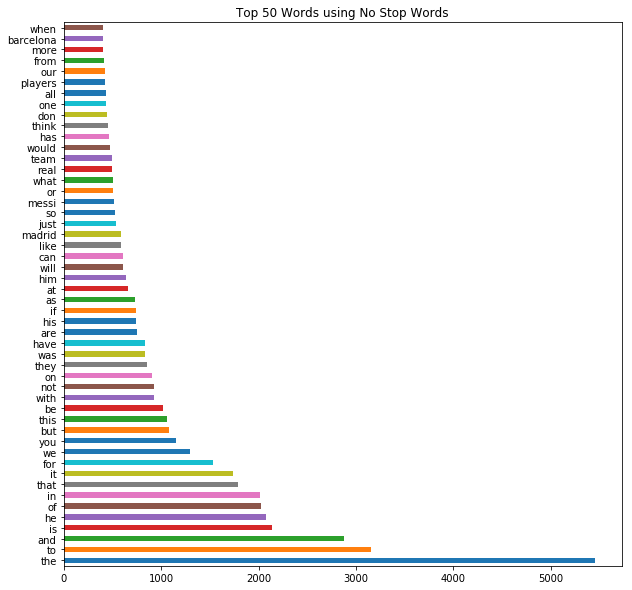

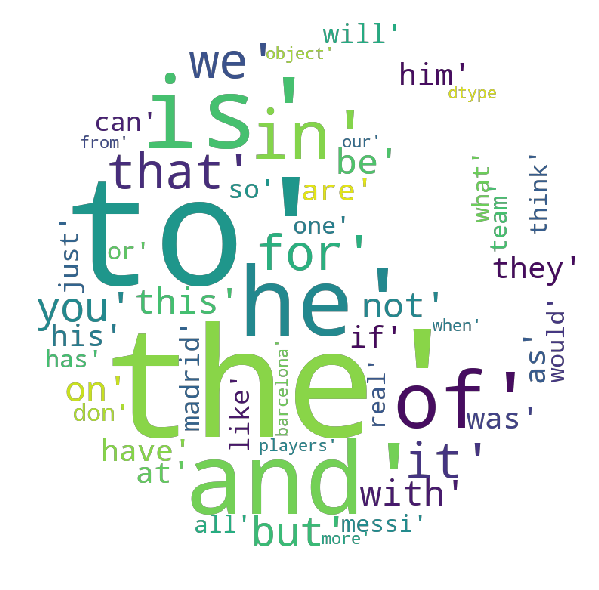

In [293]:
# Top words without stop words added

#Generate Bar Chart
plt.figure(figsize=(10,10))
cvmat_df.sum().sort_values(ascending=False)[:50].plot(kind='barh')
plt.title('Top 50 Words using No Stop Words')
plt.show()

# Generate WordCloud
top_50_no_stop_words = cvmat_df.sum().sort_values(ascending=False)[:50]
abc = str(top_50_no_stop_words.iloc[:].index)
abc = abc.strip('Index')
body_to_words(abc)
generate_wordcloud(abc, mask)

<a id='ares'></a>
## Add Regular English Stop Words to See Top Words 
### Just Illustrative Purposes

In [34]:
# regular stop words
custom_stop = list(ENGLISH_STOP_WORDS)

cv2 = CountVectorizer(stop_words=custom_stop)

cvmat2 = cv2.fit_transform(df['text'])

cvmat_df2 = pd.DataFrame(cvmat2.todense(), columns=cv2.get_feature_names())
cvmat_df2.shape

(5581, 8993)

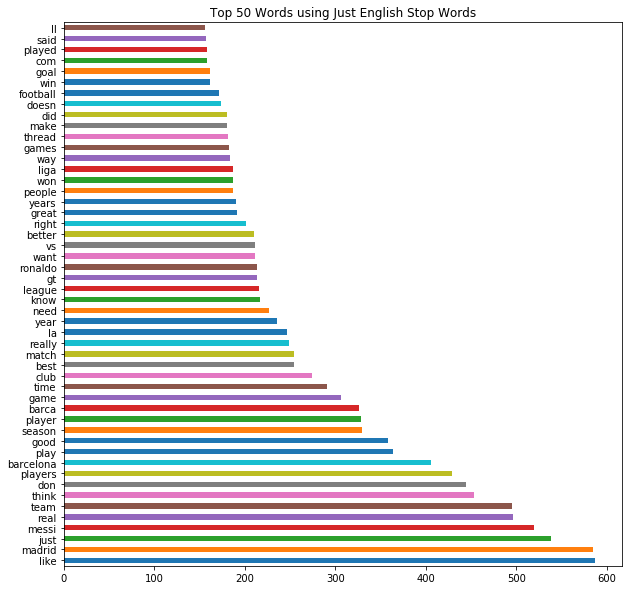

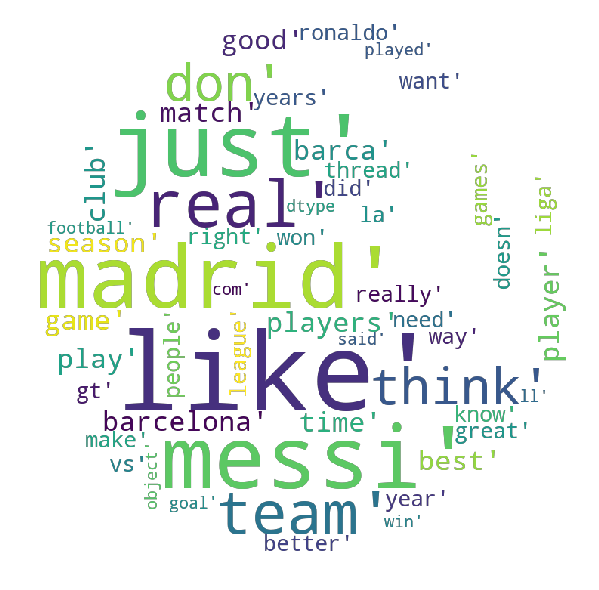

In [294]:
# Top words with just English Stop Words

#Generate Bar Chart
plt.figure(figsize=(10,10))
cvmat_df2.sum().sort_values(ascending=False)[:50].plot(kind='barh')
plt.title('Top 50 Words using Just English Stop Words')
plt.show()

# Generate WordCloud of Top Words with Players and Teams Names Included
top_50_only_english_stop = cvmat_df2.sum().sort_values(ascending=False)[:50]

abc = str(top_50_only_english_stop.iloc[:].index)
abc = abc.strip('Index')
body_to_words(abc)
generate_wordcloud(abc, mask)

<a id='aresp'></a>
## Add to Stop Words all Players from last season, Clubs name, and several nicknames for club

In [36]:
stop_words_extra = ['suarez', 'lionel', 'iniesta', 'fc', 'dembele', 'casemiro', 
                    'barcelona', 'barca', 'real', 'madrid', 'Marc', 'André', 'ter', 
                    'Stegen',  'Nélson', 'Semedo',  'Gerard', 'Piqué',  'Ivan', 'Rakitic', 
                    'Sergio', 'Busquets',  'Denis', 'Suárez',  'Philippe', 'Coutinho', 
                    'Arthur', 'Melo',  'Luis', 'Suárez',  'Leo', 'Messi',  'Ousmane', 
                    'Dembélé',  'Rafinha',  'Jasper', 'Cillessen',  'Malcom',  'Clément', 
                    'Lenglet',  'Sergi', 'Samper',  'Jordi', 'Alba',  'Munir', 'El Haddadi',  
                    'Sergi', 'Roberto',  'Arturo', 'Vidal',  'Samuel', 'Umtiti', 'Thomas', 
                    'Vermaelen',  'Jokin', 'Ezkieta', 'Jorge', 'Cuenca', 'Dani', 'Carvajal', 
                    'Jesus', 'Vallejo', 'Sergio', 'Ramos', 'Raphael', 'Varane', 'Nacho', 'Toni', 
                    'Kroos', 'Karim', 'Benzema', 'Luka', 'Modric', 'Gareth', 'Bale', 'Marcelo', 
                    'Kiko', 'Casilla', 'Casemiro,' 'Lucas', 'Vazquez', 'Marcos', 'Llorente', 
                    'Alvaro', 'Odriozola', 'Marco', 'Asensio', 'Borja', 'Mayoral', 'Isco', 'Dani', 
                    'Ceballos', 'Luca', 'Zidane', 'Andriy', 'Lunin', 'Vinicius', 'Junior', 'Martin', 
                    'Odegaard', 'Fabio', 'Coentrao', 'Federico', 'Valverde', 'Raul', 'Tomas', 
                    'Thibaut', 'Courtois', 'Cristano', 'Ronaldo']
len(stop_words_extra)

109

In [37]:
# Making stop_words_extra lowercase and checking results
stop_words_extra =[i.lower() for i in stop_words_extra]
stop_words_extra[:5]

['suarez', 'lionel', 'iniesta', 'fc', 'dembele']

In [38]:
# Adding stop_words_extra to custom_stop
custom_stop_extra = custom_stop + stop_words_extra
# checking random part
custom_stop_extra[100:105]

['empty', 'anything', 'found', 'are', 'own']

<a id='vdfcv'></a>
## Vectorizing on df['text'] with CountVectorizer and using custom_stop_extra

In [44]:
# using sklearn's ENGLISH_STOP_WORDS and players & team names

cv3 = CountVectorizer(stop_words=custom_stop_extra)

cvmat3 = cv3.fit_transform(df['text'])

X_train_df3 = pd.DataFrame(cvmat3.todense(), columns=cv3.get_feature_names())

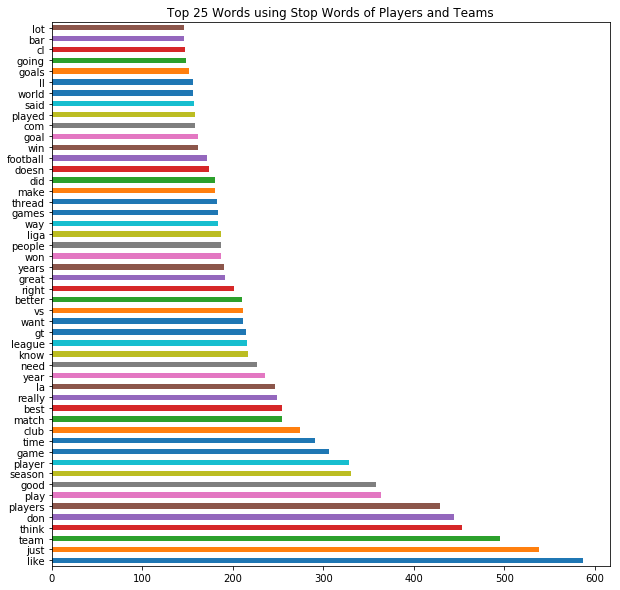

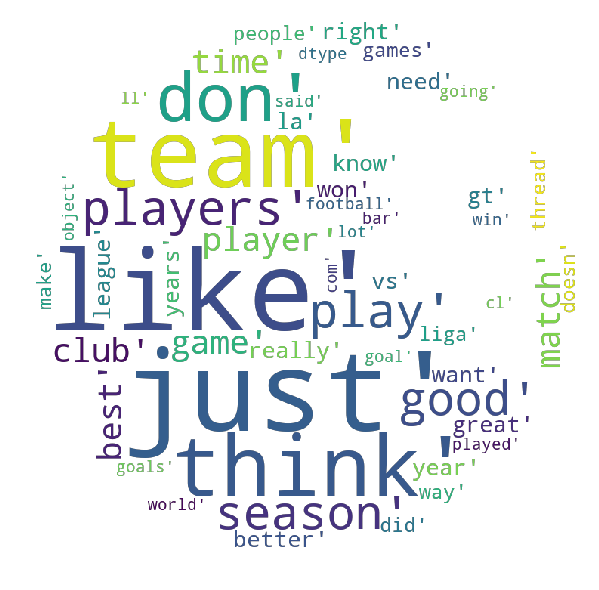

In [296]:
# Top words with English Stop Words and Player and Team Stop Words

#Generate Bar Chart
plt.figure(figsize=(10,10))
X_train_df3.sum().sort_values(ascending=False)[:50].plot(kind='barh')
plt.title('Top 25 Words using Stop Words of Players and Teams')
plt.show();

# Generate WordCloud of Top Words with Players and Teams Names Included
top_50_with_all_stop = X_train_df3.sum().sort_values(ascending=False)[:50]

abc = str(top_50_with_all_stop.iloc[:].index)
abc = abc.strip('Index')
body_to_words(abc)
generate_wordcloud(abc, mask)

<a id='tts'></a>
## Train Test Split

In [46]:
%%time

# Create X and y.
X = df['text']
y = df['subreddit']

# Train/Test Split.
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    random_state=42, 
                                                   stratify=y)

CPU times: user 4.87 ms, sys: 256 µs, total: 5.12 ms
Wall time: 4.47 ms


In [47]:
# Instanstiate and Use CountVectorizer with Custom Stop Words (custom_stop_extra)

cv_tts = CountVectorizer(stop_words=custom_stop_extra)

cvmat1 = cv_tts.fit_transform(X_train)

X_train_df2 = pd.DataFrame(cvmat1.todense(), columns=cv_tts.get_feature_names())

In [48]:
# needs to be vectorized to run this / Check output
X_train_df2.iloc[:,:].sort_values(by='hey', ascending=False).head(2)

,aaaaaaabm,aaid,aajbqn,aaqezm,abandon,abandoned,abandoning,abar,abdelhak,abidal,...,zlatan,zomg,zone,zquez,zs,zsw,zubi,zubizaretta,zz,zzzzzzzzzz
875,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
245,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [72]:
X_train_df.sum().sort_values(ascending=False)[:10]

like       390
just       356
team       350
think      328
don        293
players    288
good       258
player     232
season     232
play       229
dtype: int64

<a id='models'></a>
# Models Section

<a id='htf'></a>
## Hashing and TF-IDF

In [49]:
%%time

# Instantiate Hashing Vectorizer
hashvect = HashingVectorizer(stop_words=custom_stop_extra)

logreg_hash = LogisticRegression()

# Fit and transform
X_train_hash = hashvect.fit_transform(X_train)

logreg_hash.fit(X_train_hash, y_train)

# # Transform of Hash model
X_test_hash = hashvect.transform(X_test)

CPU times: user 949 ms, sys: 53.7 ms, total: 1 s
Wall time: 303 ms


In [50]:
# hash score on train data
logreg_hash.score(X_train_hash, y_train)

0.8689489168226798

In [51]:
# hash score on test data
logreg_hash.score(X_test_hash, y_test)

0.7024972855591748

<a id='tfidv'></a>
## TfidfVectorizer Models

In [52]:
%%time
# Instantiate TFID Vectorizer
Tfidvect = TfidfVectorizer(stop_words=custom_stop, max_df=250)

# TFID transform on train
X_train_Tfid_vect = Tfidvect.fit_transform(X_train)

df_X_text_train_Tfid = pd.DataFrame(X_train_Tfid_vect.toarray())

CPU times: user 70.1 ms, sys: 64.6 ms, total: 135 ms
Wall time: 134 ms


In [53]:
# TFID transform on test
X_test_Tfid_vect = Tfidvect.transform(X_test)

df_X_text_test_Tfid = pd.DataFrame(X_test_Tfid_vect.toarray())

In [54]:
# TFID LogReg
logreg_Tfid_train = LogisticRegression()
model_Tfid = logreg_Tfid_train.fit(X_train_Tfid_vect, y_train)

In [55]:
# Tfid score on train data
model_Tfid.score(X_train_Tfid_vect, y_train)

0.9245787643755015

In [56]:
# Tfid score on test data
model_Tfid.score(X_test_Tfid_vect, y_test)

0.7687296416938111

In [57]:
# 7484 features in TFID
df_X_text_train_Tfid.shape

(3739, 7475)

<a id='tfidvlr'></a>
## TfidfVectorizer and LogisticRegression

In [58]:
%%time

X_tfid = df['text']
y_tfid = df['subreddit']

# Train/Test Split.
X_train_tfid, X_test_tfid, y_train_tfid, y_test_tfid = train_test_split(X_tfid,
                                                    y_tfid,
                                                    test_size=0.33,
                                                    random_state=42, 
                                                   stratify=y)

# set up Gridsearch w/ Pipeline (which you put in a list of Tuples for pipe args)

pipe = Pipeline([
    ('vect', TfidfVectorizer()),
    ('model', LogisticRegression())
])

# params needs to be a dictionary
params = {
    'vect__ngram_range': [(2,2), (3,3), (1,3), (2,3)],
    'vect__min_df': [2,3,4,5,6,8],                        # vect__ double underscore and then min_df comes from arg from TfidfVectorizer above
    'vect__stop_words': [custom_stop_extra],
    'model__penalty': ['l1','l2']
}

gs_tfid = GridSearchCV(pipe, params, cv=5, verbose=2, n_jobs=-1)  


gs_tfid.fit(X_train_tfid, y_train_tfid)



Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other'

[CV] model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=2, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=3, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=3, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=3, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=3, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=3, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=3, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=3, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=3, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.4s


[CV] model__penalty=l1, vect__min_df=3, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=3, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=3, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=3, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=3, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=4, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=5, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=5, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=5, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=5, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=5, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=5, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=5, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=5, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=5, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=5, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=5, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=5, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=5, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=6, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=6, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=6, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=6, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=6, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=6, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=6, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=6, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=6, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=6, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=6, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=6, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=6, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=6, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=6, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=6, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=8, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=2, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=2, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=3, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=3, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=3, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=3, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=3, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=3, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=3, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=3, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=3, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    8.1s


[CV]  model__penalty=l2, vect__min_df=3, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=3, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=3, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=3, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=3, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=4, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=4, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=5, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=5, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=5, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=5, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=5, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=5, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=5, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=5, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=5, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=5, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=5, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=5, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=6, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=6, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=6, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=6, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=6, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=5, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=6, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=6, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=6, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=6, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=6, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=6, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=8, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=8, vect__ngram_range=(1, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:   13.3s finished


CPU times: user 1.48 s, sys: 261 ms, total: 1.74 s
Wall time: 13.9 s


In [59]:
predictions_tfid = gs_tfid.predict(X_test_tfid)

In [60]:
accuracy_score(y_test_tfid, predictions_tfid)

0.7041259500542888

In [61]:
gs_tfid.score(X_test_tfid, y_test_tfid)

0.7041259500542888

In [62]:
gs_tfid.score(X_train_tfid, y_train_tfid)

0.901577962021931

In [63]:
gs_tfid.best_estimator_.score(X_test_tfid, y_test_tfid)

0.7041259500542888

In [64]:
gs_tfid.best_estimator_.steps[0]

('vect', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
         dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
         lowercase=True, max_df=1.0, max_features=None, min_df=2,
         ngram_range=(1, 3), norm='l2', preprocessor=None, smooth_idf=True,
         stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of',..., 'coentrao', 'federico', 'valverde', 'raul', 'tomas', 'thibaut', 'courtois', 'cristano', 'ronaldo'],
         strip_accents=None, sublinear_tf=False,
         token_pattern='(?u)\\b\\w\\w+\\b', tokenizer=None, use_idf=True,
         vocabulary=None))

In [65]:
target_names = ['Barca', 'realmadrid']

In [66]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
def make_nice_conmat(y_test_tfid, preds):

    cmat = confusion_matrix(y_test_tfid, preds)
    print(f'Accuracy: {accuracy_score(y_test, preds)}')
    print(classification_report(y_test_tfid, preds))
    return pd.DataFrame(cmat, columns=['Predicted ' + str(i) for i in target_names],\
            index=['Actual ' + str(i) for i in target_names])

make_nice_conmat(y_test_tfid, predictions_tfid)

Accuracy: 0.7041259500542888
             precision    recall  f1-score   support

      Barca       0.72      0.68      0.70       935
 realmadrid       0.69      0.72      0.71       907

avg / total       0.70      0.70      0.70      1842



,Predicted Barca,Predicted realmadrid
Actual Barca,640,295
Actual realmadrid,250,657


In [67]:
#rev
# check the steps one at a time from gs_tfid to see how to logically think through getting to this data
gs_tfid.best_estimator_.steps[0][1].get_feature_names()

['abidal',
 'ability',
 'able',
 'able compete',
 'able consistently',
 'able consistently attend',
 'able hold',
 'able understand',
 'able understand club',
 'abroad',
 'absolute',
 'absolutely',
 'absolutely right',
 'absurd',
 'academy',
 'acceleration',
 'accept',
 'accepted',
 'accepting',
 'accommodate',
 'according',
 'accordingly',
 'account',
 'accuracy',
 'accurate',
 'achieve',
 'achieved',
 'achievement',
 'achievements',
 'achraf',
 'acknowledge',
 'acknowledge want',
 'act',
 'acted',
 'action',
 'actions',
 'actual',
 'actually',
 'actually pretty',
 'actually pretty entertaining',
 'actually spelled',
 'actually spelled lot',
 'adama',
 'adapted',
 'adapted getting',
 'adapting',
 'adapting new',
 'adapting new coach',
 'add',
 'added',
 'adding',
 'addition',
 'additional',
 'additionally',
 'address',
 'adebayor',
 'adidas',
 'adjusted',
 'adjusting',
 'admit',
 'admitted',
 'admitting',
 'advance',
 'advantage',
 'advantaged',
 'advantages',
 'advice',
 'aeb',
 'af'

In [68]:
pd.DataFrame(gs_tfid.best_estimator_.steps[1][1].coef_, columns=gs_tfid.best_estimator_.steps[0][1].get_feature_names())

,abidal,ability,able,able compete,able consistently,able consistently attend,able hold,able understand,able understand club,abroad,...,zero,zindane,zindane best,zindane best manager,zinedine,zizou,zlatan,zone,zubi,zz
0,-0.456658,0.119425,-0.379343,-0.130899,0.036202,0.036202,0.14375,0.036202,0.036202,-0.184523,...,0.040138,0.119599,0.119599,0.119599,0.334502,0.787251,0.606706,-0.187827,-0.186366,0.364513


In [69]:
gs_tfid.best_estimator_.steps

[('vect', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
          dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
          lowercase=True, max_df=1.0, max_features=None, min_df=2,
          ngram_range=(1, 3), norm='l2', preprocessor=None, smooth_idf=True,
          stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of',..., 'coentrao', 'federico', 'valverde', 'raul', 'tomas', 'thibaut', 'courtois', 'cristano', 'ronaldo'],
          strip_accents=None, sublinear_tf=False,
          token_pattern='(?u)\\b\\w\\w+\\b', tokenizer=None, use_idf=True,
          vocabulary=None)),
 ('model',
  LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
            intercept_scaling=1, max_iter=1

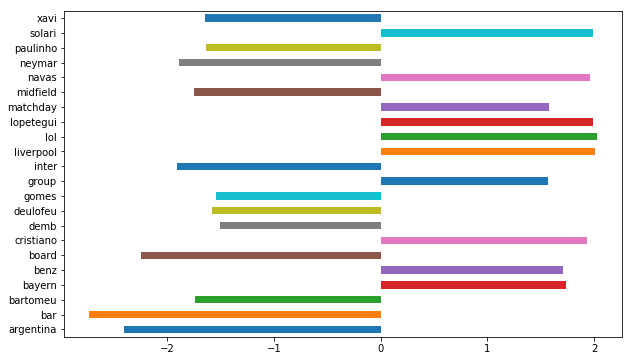

In [70]:
## plot 
plt.figure(figsize=(10,6))
feats = pd.DataFrame(gs_tfid.best_estimator_.steps[1][1].coef_, columns=gs_tfid.best_estimator_.steps[0][1].get_feature_names())
feats.loc[0,feats.iloc[0,:].abs() >1.5].plot(kind='barh');


<a id='rfms'></a>
## Random Forest Models

In [71]:
%%time

# Instantiate
rfc = RandomForestClassifier()
etc = ExtraTreesClassifier()

X_re = df['text']
y_re = df['subreddit']


# Instantiate TFID Vectorizer
Tfidvect_cv = TfidfVectorizer(stop_words=custom_stop, max_df=250)

# TFID transform on train
X_train_Tfid_vect = Tfidvect_cv.fit_transform(X_re)

# Train/Test Split. Only for getting cross value score use the '_c' ones
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(X_train_Tfid_vect,
                                                    y_re,
                                                    test_size=0.33,
                                                    random_state=42, 
                                                    stratify=y)




print('rfc cvs train:',cross_val_score(rfc, X_train_c, y_train_c))
print('rfc cvs train mean:',cross_val_score(rfc, X_train_c, y_train_c).mean())
print('rfc cvs test:',cross_val_score(rfc, X_test_c, y_test_c))
print('rfc cvs test mean:',cross_val_score(rfc, X_test_c, y_test_c).mean())

print('etc cvs train:',cross_val_score(etc, X_train_c, y_train_c))
print('etc cvs train mean:',cross_val_score(etc, X_train_c, y_train_c).mean())
print('etc cvs test:',cross_val_score(etc, X_test_c, y_test_c))
print('etcc cvs test mean:',cross_val_score(etc, X_test_c, y_test_c).mean())

rfc cvs train: [0.69927827 0.69983949 0.70064205]
rfc cvs train mean: 0.7138279007123786
rfc cvs test: [0.65365854 0.65798046 0.68352365]
rfc cvs test mean: 0.6569108815945351
etc cvs train: [0.71531676 0.7247191  0.72311396]
etc cvs train mean: 0.7218540119615059
etc cvs test: [0.69268293 0.70358306 0.69168026]
etcc cvs test mean: 0.6970766927833898
CPU times: user 8.43 s, sys: 2.57 ms, total: 8.43 s
Wall time: 8.42 s


In [72]:
%%time

pipe = Pipeline([
    ('vect', CountVectorizer()),
    ('model',RandomForestClassifier(random_state=42))
])

params = {
    'model__n_estimators': [20, 40, 60],
    'model__max_depth': [5, 8, 12],
    'model__max_features': ['auto', 'log2', 1.0],
    'vect__stop_words': [custom_stop_extra]
}   


gsrf = GridSearchCV(pipe, param_grid=params,cv=5, n_jobs=-1)
gsrf.fit(X_train, y_train)
print('Grid Search CV best score: ' + str(gsrf.best_score_))
print('Grid Search Best Params: ' + str(gsrf.best_params_))


Grid Search CV best score: 0.6568601230275475
Grid Search Best Params: {'model__max_depth': 12, 'model__max_features': 'auto', 'model__n_estimators': 60, 'vect__stop_words': ['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 

In [73]:
%%time

pipe = Pipeline([
    ('vect', CountVectorizer()),
    ('model',DecisionTreeClassifier(random_state=42))
])

params = {
    'model__max_depth': [40, 50],
    'model__max_features': [.5, .7, 'auto'],
    'vect__stop_words': [custom_stop_extra]
}   


gsrf = GridSearchCV(pipe, param_grid=params,cv=5, n_jobs=-1)
gsrf.fit(X_train, y_train)
print('Grid Search CV best score: ' + str(gsrf.best_score_))
print('Grid Search Best Params: ' + str(gsrf.best_params_))


Grid Search CV best score: 0.6151377373629313
Grid Search Best Params: {'model__max_depth': 50, 'model__max_features': 0.5, 'vect__stop_words': ['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other',

In [74]:
%%time

# can manually change the params in the GridSearch in order to test out and find out the best params and which direction
# .... to change params to

pipe = Pipeline([
    ('vect', CountVectorizer()),
    ('model',RandomForestClassifier(random_state=42))
])

rfc_params = {
    'model__n_estimators': [35, 50],
    'model__max_depth': [12, 20, 30],
    'model__max_features': [0.1, .5, .7, 'auto'],
    'vect__stop_words': [custom_stop_extra]
}

gsrf2 = GridSearchCV(pipe, param_grid=rfc_params,cv=5, n_jobs=-1, verbose=2)  
gsrf2.fit(X_train, y_train)
print('Grid Search CV best score: ' + str(gsrf2.best_score_))
print('Grid Search Best Params: ' + str(gsrf2.best_params_))


Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please'

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    3.2s


[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'a

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', '

[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:   18.7s finished


Grid Search CV best score: 0.6651511099224392
Grid Search Best Params: {'model__max_depth': 30, 'model__max_features': 'auto', 'model__n_estimators': 50, 'vect__stop_words': ['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 

In [75]:
print('RandomForestClassifier Grid Search CV best score: ' + str(gsrf2.best_score_))

RandomForestClassifier Grid Search CV best score: 0.6651511099224392


In [76]:
pipe = Pipeline([
    ('vect', TfidfVectorizer()),
    ('model', LogisticRegression())
])

params = {
    'vect__ngram_range':[(2,2),(3,3)],
    'vect__min_df':[2,4,8],
    'vect__stop_words':[custom_stop_extra],
    'model__penalty':['l2', 'l1']
}

gsPlr = GridSearchCV(pipe, params, cv=5, verbose=2, n_jobs=-1)

gsPlr.fit(X_train, y_train)
print('LogisticRegression Grid Search CV best score: ' + str(gsPlr.best_score_))
print('LogisticRegression Grid Search Best Params: ' + str(gsPlr.best_params_))

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other',

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l2, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l2, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.3s


[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=2, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=4, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=4, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV] model__penalty=l1, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV] model__penalty=l1, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'own

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(2, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[CV]  model__penalty=l1, vect__min_df=8, vect__ngram_range=(3, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 'whether', 'empty', 'anything', 'found', 'are', 'ow

[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:    2.6s finished


LogisticRegression Grid Search CV best score: 0.5560310243380583
LogisticRegression Grid Search Best Params: {'model__penalty': 'l2', 'vect__min_df': 2, 'vect__ngram_range': (2, 2), 'vect__stop_words': ['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con

In [77]:
print('LogisticRegressionGrid Search CV best score: ' + str(gsPlr.best_score_))

LogisticRegressionGrid Search CV best score: 0.5560310243380583


In [203]:
%%time
pipe = Pipeline([
    ('vect', TfidfVectorizer()),
    ('model', RandomForestClassifier())
])

params = {
    'vect__ngram_range':[(1,2),(2,3),(3,5)],
    'vect__min_df':[2,4,8],
    'vect__stop_words':[custom_stop_extra],
    'model__n_estimators': [35, 50],
    'model__max_depth': [12, 20, 30],
    'model__max_features': [0.1, .5, .7, 'auto'],
}

gsPrf = GridSearchCV(pipe, params, cv=5, verbose=2, n_jobs=-1)

gsPrf.fit(X_train, y_train)
print('RandomForestClassifier Grid Search CV best score: ' + str(gsPrf.best_score_))
print('RandomForestClassifier Grid Search Best Params: ' + str(gsPrf.best_params_))

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', '

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.4s


[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   13.7s


[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   33.6s


[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=12, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  1.1min


[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=20, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.1, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.5, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', '

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=0.7, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:  1.9min


[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=35, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=2, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV] model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that', 

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=4, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(1, 2), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(2, 3), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[CV]  model__max_depth=30, model__max_features=auto, model__n_estimators=50, vect__min_df=8, vect__ngram_range=(3, 5), vect__stop_words=['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon', 'who', 'hundred', 'part', 'which', 'forty', 'fire', 'yet', 'con', 'between', 'whereafter', 'amoungst', 'please', 'other', 'that',

[Parallel(n_jobs=-1)]: Done 1080 out of 1080 | elapsed:  2.0min finished


RandomForestClassifier Grid Search CV best score: 0.6563252206472319
RandomForestClassifier Grid Search Best Params: {'model__max_depth': 30, 'model__max_features': 'auto', 'model__n_estimators': 50, 'vect__min_df': 4, 'vect__ngram_range': (1, 2), 'vect__stop_words': ['most', 'nothing', 'some', 'within', 'not', 'your', 'up', 'de', 'go', 'whither', 'fifty', 'so', 'ourselves', 'too', 'onto', 'upon', 'show', 'herein', 'these', 'down', 'etc', 'no', 'been', 'may', 'cannot', 'ltd', 'ever', 'couldnt', 'thereby', 'same', 'do', 'side', 'through', 'only', 'of', 'they', 'third', 'he', 'for', 'still', 'anyway', 'neither', 'seems', 'wherever', 'a', 'eg', 'thus', 'have', 'seemed', 'else', 'after', 'around', 'when', 'how', 'why', 'name', 'except', 'very', 'has', 'across', 'becomes', 'full', 'otherwise', 'during', 'his', 'hasnt', 'being', 'sometimes', 'this', 'where', 'would', 'three', 'itself', 'last', 'next', 'each', 'find', 'ours', 'along', 'must', 'our', 'latter', 'something', 'beside', 'thereupon

In [204]:
print('RandomForestClassifier Grid Search CV best score: ' + str(gsPrf.best_score_))

RandomForestClassifier Grid Search CV best score: 0.6563252206472319


<a id='wcg'></a>
## Word Cloud Generator

In [216]:
% ! git clone https://github.com/amueller/word_cloud.git

UsageError: Line magic function `%!` not found (But cell magic `%%!` exists, did you mean that instead?).


In [127]:
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import multidict as multidict
import os
import re
import urllib
import requests
from PIL import Image
from os import path
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from os import path


In [110]:
!pip install aiohttp

    100% |████████████████████████████████| 1.1MB 33.1MB/s eta 0:00:01
    100% |████████████████████████████████| 163kB 64.1MB/s eta 0:00:01
    100% |████████████████████████████████| 317kB 56.9MB/s eta 0:00:01
  Running setup.py bdist_wheel for yarl ... done
  Stored in directory: /home/ec2-user/.cache/pip/wheels/e3/f0/13/d7c1c5cd76ef321fb635ce79232ca973cd0c91fabaaa71e1c7
Successfully built yarl


In [ ]:
background_color='white'

In [221]:
#words = 'access guest guest apartment area area bathroom bed bed bed bed bed bedroom block coffee coffee coffee coffee entrance entry francisco free garden guest home house kettle kettle kitchen kitchen kitchen kitchen kitchen kitchen living located microwave neighborhood new park parking place privacy private queen room san separate separate shared space space space street suite time welcome'

# For square
#url = 'http://pluspng.com/img-png/circle-shape-png-hd-circle-png-hd-1600.png'

# For circle use
url = 'https://www.freeiconspng.com/uploads/world-cup-soccer-ball-png-background-32.jpg'

res = requests.get(url)
res.status_code

mask = np.array(Image.open(requests.get(url, stream=True).raw))
                                        
def generate_wordcloud(words, mask):
    word_cloud = WordCloud(width = 400, height = 512, background_color=None, mode="RGBA", stopwords=STOPWORDS, mask=mask).generate(words)
    plt.figure(figsize=(8,8),facecolor = 'white', edgecolor='blue')
    plt.imshow(word_cloud)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()
                                        
                                        

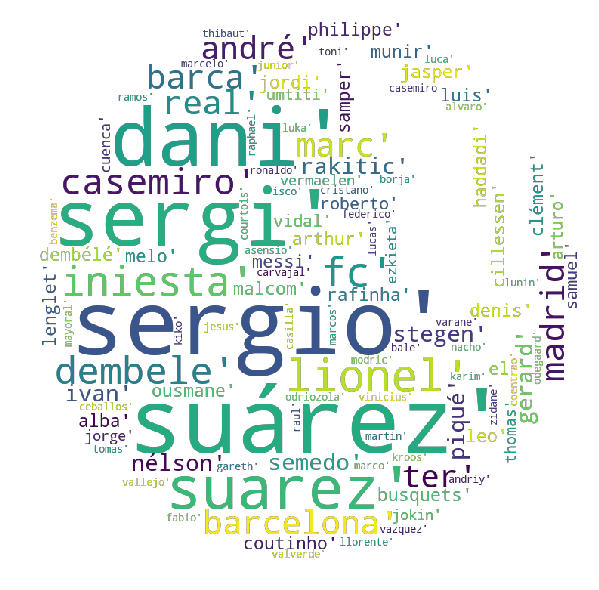

In [222]:
# Word Cloud of Stop Words with Players Names Only for Illustration Sake

a = str(stop_words_extra)
generate_wordcloud(a, mask)

<a id='end'></a>
### See the executive summary and presentation for conclusions
#### End of File 